In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import time
import numpy as np
import cv2 # yes, you can do this, but see below!
import os


In [3]:
"""
Load images from directory, convert them to float and grayscale.
"""
def loadImages(directory='photos', num_images=18, max_width=1000, max_height=800):
    images = []
    
    for i in range(num_images):
        filename = os.path.join(directory, f"{i:02d}.jpg")
        
        # Read Image
        img = cv2.imread(filename)
        # just make sure image is imported correctly
        if img is None:
            print(f"Error: Could not load image {filename}")
            continue
            
        # Image Resizing while keep the height-width ratio 
        h, w = img.shape[:2]
        scale = min(max_width/w, max_height/h)
        
        # If image is larger than max_width or max_height, then resize the image
        if scale < 1:
            new_w, new_h = int(w * scale), int(h * scale)
            img = cv2.resize(img, (new_w, new_h))
            print(f"Resized image from {w}x{h} to {new_w}x{new_h}")
            
        # BGR -> RGB
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # change into Grayscale
        img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
        
        # then change into float type(0~1)
        img_float = img_gray.astype(np.float32) / 255.0
        
        # finally add to list(as mentioned in the requirements)
        images.append(img_float)
        
        print(f"Loaded image {i:02d}.jpg: shape={img_float.shape}, dtype={img_float.dtype}")
    
    print(f"Total {len(images)} images loaded")
    
    # Debugging Code to visualize some pictures(5 photos seems good)
    if len(images) > 0:
        fig, axes = plt.subplots(1, min(5, len(images)), figsize=(15, 5))
        if min(5, len(images)) == 1:
            axes = [axes]
        
        for i, ax in enumerate(axes):
            ax.imshow(images[i], cmap='gray')
            ax.set_title(f"Image {i:02d}")
            ax.axis('off')
    
        plt.tight_layout()
        plt.show()
    
    return images


Resized image from 4000x2252 to 1000x563
Loaded image 00.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded image 01.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded image 02.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded image 03.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded image 04.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded image 05.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded image 06.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded image 07.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded image 08.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded image 09.jpg: shape=(563, 1000), dtype=float32
Resized image from 4000x2252 to 1000x563
Loaded im

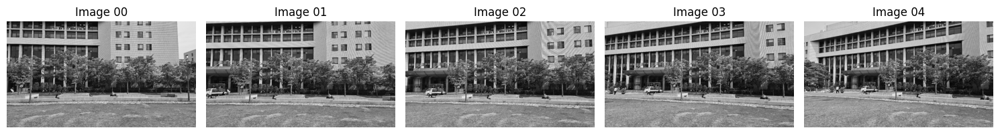

In [41]:
# Might need to fix the max_width or max_height for debugging purposes
images = loadImages(directory='assets/1', num_images=18, max_width=1000, max_height=800)

In [5]:
'''
Previous Code from Assignment 3!
'''

"""
Implements a 2D convolution operation on an image with a given kernel.
"""
def conv_2d(img, kernel, use_vectorized=True):
    # Get kernel dimensions
    k_height, k_width = kernel.shape
    
    # Calculate padding size
    pad_h = k_height // 2
    pad_w = k_width // 2
    
    # Pad the image with zeros around the borders to handle boundary conditions
    padded = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant', constant_values=0)

    if use_vectorized:
        # Vectorized implementation for better performance
        from numpy.lib.stride_tricks import sliding_window_view
        
        # Create a view of all possible windows in the padded image
        # This creates a 4D array where each element represents a window of size
        windows = sliding_window_view(padded, (k_height, k_width))
        
        # Use Einstein summation to efficiently compute element-wise multiplication and sum
        output = np.einsum('ijkl,kl->ij', windows, kernel)
    else:
        # Traditional loop-based implementation (slower but more intuitive)
        output = np.zeros_like(img, dtype=np.float64)
        
        # Iterate through each pixel of the image
        for i in range(img.shape[0]):
            for j in range(img.shape[1]):
                # Apply the kernel at each position by multiplying and summing
                output[i, j] = np.sum(padded[i:i+k_height, j:j+k_width] * kernel)
                
    return output

"""
Corner detection function using either minimum eigenvalue or Harris measure.
"""
def cornerDetect(img, winSize=7, type=0) -> np.array:
    # Define Sobel kernels for gradient computation
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

    # Step 1: Apply Sobel kernels to get image derivatives
    Ix = conv_2d(img, sobel_x)  # Horizontal gradient
    Iy = conv_2d(img, sobel_y)  # Vertical gradient

    # Compute products of derivatives for structure tensor
    Ix2 = Ix ** 2  # Ix squared
    Iy2 = Iy ** 2  # Iy squared
    Ixy = Ix * Iy   # Ix * Iy

    # Define summation window 
    window = np.ones((winSize, winSize))
    
    # Step 2: Sum up components over the window to get structure tensor elements
    Sx2 = conv_2d(Ix2, window)  # Sum of Ix²
    Sy2 = conv_2d(Iy2, window)  # Sum of Iy²
    Sxy = conv_2d(Ixy, window)  # Sum of Ix*Iy

    # Calculate trace and determinant of the structure tensor
    traceM = Sx2 + Sy2  
    detM = Sx2 * Sy2 - Sxy ** 2  

    # Step 3: Calculate corner strength based on selected method
    if type == 0:  # Minimum eigenvalue method
        corner_strength = np.zeros_like(detM)
        
        for i in range(img.shape[0]):
            for j in range(img.shape[1]):
                # Structure tensor for current pixel
                H = np.array([[Sx2[i, j], Sxy[i, j]], 
                             [Sxy[i, j], Sy2[i, j]]])
                
                # Compute eigenvalues using 'NumPy' <--- this is from the requirements 
                eigenvalues = np.linalg.eigvals(H)
                
                # Use minimum eigenvalue as corner strength
                corner_strength[i, j] = np.min(eigenvalues)
    else:  # Harris method
        k = 0.04  # Harris sensitivity parameter <--- but not for the Harris, but do they have harris method for numpy?
        corner_strength = detM - k * (traceM ** 2)
        
    return corner_strength


In [6]:
"""
Impliment the nonMaximumSuppression to find local maxima 
Not sure We can use spicy library so...
We tooke the idea and code from github below
"https://github.com/jimmy133719/Harris-corner-detection/blob/master/main.py"
"""
def nonMaximumSuppression(img, threshold, winSize=7):
    # Normalize the response map to [0, 1] range
    r = img.astype(np.float64)
    r_min, r_max = r.min(), r.max()
    r_norm = (r - r_min) / (r_max - r_min + 1e-12)  # Add epsilon to avoid division by zero
    
    # Get image dimensions
    height, width = r_norm.shape
    
    # Padding size
    pad = winSize // 2
    
    # Create a list to store local maxima
    local_maxima = []
    
    # Iterate through each pixel (excluding border)
    for y in range(pad, height - pad):
        for x in range(pad, width - pad):
            # Get the current pixel value
            val = r_norm[y, x]
            
            # Skip if below threshold
            if val <= threshold:
                continue
            
            # Get the window around the current pixel
            window = r_norm[y - pad:y + pad + 1, x - pad:x + pad + 1]
            
            # Check if the current pixel is the maximum in the window
            if val == np.max(window):
                local_maxima.append((y, x))
    
    return local_maxima

In [7]:
"""
Detect feature points in an image using Harris corner detector with non-maximum suppression.
"""
def getFeaturePoints(image, k=0.04, threshold=0.01, window_size=7, nms_window_size=7, plot=True):
    # Compute corner response (Harris method)
    corner_response = cornerDetect(image, winSize=window_size, type=1)  # type=1 for Harris
    
    # Apply non-maximum suppression to find local maxima
    feature_points = nonMaximumSuppression(corner_response, threshold=threshold, winSize=nms_window_size)
    
    print(f"Detected {len(feature_points)} corner points")
    
    # Visualize results if requested
    if plot and len(feature_points) > 0:
        # 시각화를 위한 코드
        plt.figure(figsize=(10, 8))
        plt.imshow(image, cmap='gray')
        
        # feature_points가 (y, x) 형태이므로 플롯을 위해 순서를 바꿈
        if len(feature_points) > 0:
            y, x = zip(*feature_points)
            plt.scatter(x, y, c='red', s=30, marker='x')
        
        plt.title(f"Detected {len(feature_points)} Feature Points")
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    # Convert (y, x) to (x, y) coordinates for later processing
    feature_points_xy = [(x, y) for y, x in feature_points]
    
    return feature_points_xy

Detected 22 corner points


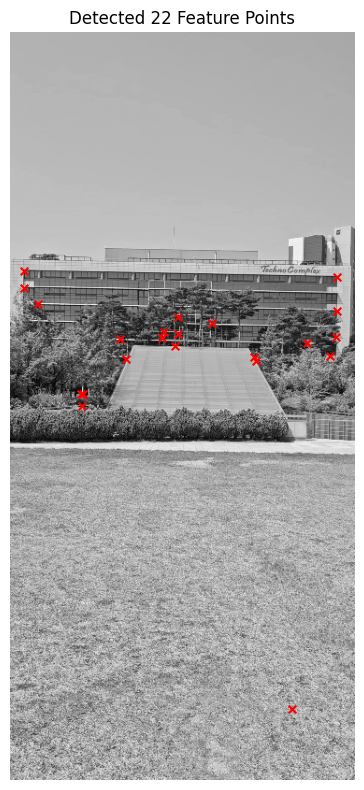

Number of corners detected: 22


In [8]:
# Starts with threshold=0.5, we will reduce it later on for the match.
corners = getFeaturePoints(images[0], k=0.04, threshold=0.5, window_size=3, nms_window_size=5)

# 검출된 코너 개수 확인
print(f"Number of corners detected: {len(corners)}")

In [60]:
"""
Extract feature descriptors for a given list of feature points.

Parameters:
-----------
image : ndarray
    Input grayscale image (float32, values in [0, 1])
feature_points : list
    List of (x, y) feature points
mode : str
    'pixels': Use pixel values in a window as feature vector
    'gradients': Create histogram of gradient directions
window_size : int
    Size of the window around each feature point
    
Returns:
--------
list
    List of feature descriptors (one for each feature point)
"""
def getFeatureDescriptors(image, feature_points, mode='pixels', window_size=9):
    # Make sure window_size is odd
    if window_size % 2 == 0:
        window_size += 1
    
    # Half window size
    half_window = window_size // 2
    
    # Get image dimensions
    height, width = image.shape
    
    # Initialize list to store descriptors
    descriptors = []
    
    # Process convolution first so that reduce computing resources
    if mode == 'gradients':
        # Calculate image gradients
        dx = cv2.Sobel(image, cv2.CV_32F, 1, 0, ksize=3)
        dy = cv2.Sobel(image, cv2.CV_32F, 0, 1, ksize=3)

    # Process each feature point
    for (x, y) in feature_points:
        # Skip points too close to the image border
        if (x < half_window or x >= width - half_window or 
            y < half_window or y >= height - half_window):
            continue
        
        if mode == 'pixels':
            # Extract pixel values in the window
            window = image[y - half_window:y + half_window + 1, 
                           x - half_window:x + half_window + 1]
            
            # Flatten the window to create feature vector
            descriptor = window.flatten()
            
            # Normalize descriptor
            norm = np.linalg.norm(descriptor)
            if norm > 0:
                descriptor = descriptor / norm
            
        elif mode == 'gradients':
            # Extract gradient windows
            dx_window = dx[y - half_window:y + half_window + 1, 
                           x - half_window:x + half_window + 1]
            dy_window = dy[y - half_window:y + half_window + 1, 
                           x - half_window:x + half_window + 1]           

            # Calculate gradient magnitude and direction
            magnitude = np.sqrt(dx_window**2 + dy_window**2)
            direction = np.arctan2(dy_window, dx_window)
            
            # Convert direction from [-pi, pi] to [0, 2*pi]
            direction = (direction + np.pi) % (2 * np.pi)
            
            # Create histogram of gradient directions (18 bins)
            num_bins = 18
            bin_width = 2 * np.pi / num_bins
            histogram = np.zeros(num_bins, dtype=np.float32)
            
            # Fill histogram using magnitude-weighted votes
            for i in range(window_size):
                for j in range(window_size):
                    if magnitude[i, j] > 0:
                        bin_idx = int(direction[i, j] / bin_width)
                        bin_idx %= num_bins
                        histogram[bin_idx] += magnitude[i, j]
            
            # Normalize histogram
            norm = np.linalg.norm(histogram)
            if norm > 0:
                histogram = histogram / norm
            
            descriptor = histogram
            
        else:
            raise ValueError("Mode must be 'pixels' or 'gradients'")
        
        descriptors.append(descriptor)
    
    print(f"Generated {len(descriptors)} descriptors using {mode} mode")
    if len(descriptors) > 0:
        print(f"Descriptor shape: {descriptors[0].shape}")
    
    return descriptors

In [10]:
# 'pixels' 모드로 특징 기술자 추출
pixel_descriptors = getFeatureDescriptors(images[0], corners, mode='pixels', window_size=9)

# 'gradients' 모드로 특징 기술자 추출
gradient_descriptors = getFeatureDescriptors(images[0], corners, mode='gradients', window_size=15)

Generated 22 descriptors using pixels mode
Descriptor shape: (81,)
Generated 22 descriptors using gradients mode
Descriptor shape: (18,)


In [11]:
def match2Images(image1, image2, points1, points2, desc1, desc2, 
                 match_method='euclidean', ratio_threshold=0.8, plot=True):
    """
    Match feature points between two images using their descriptors.
    
    Parameters:
    -----------
    image1, image2 : ndarray
        Input images
    points1, points2 : list
        Lists of feature points for each image
    desc1, desc2 : list
        Lists of feature descriptors for each image
    match_method : str
        'euclidean': Use Euclidean distance
        'ncc': Use Normalized Cross Correlation
    ratio_threshold : float
        Threshold for the ratio test (Lowe's ratio test)
    plot : bool
        Whether to plot the matches
        
    Returns:
    --------
    list
        List of (index1, index2) tuples representing matches
    """
    matches = []
    
    # Convert descriptor lists to numpy arrays for faster processing
    desc1_array = np.array(desc1)
    desc2_array = np.array(desc2)
    
    # For each descriptor in the first image
    for i in range(len(desc1)):
        # Compute distances to all descriptors in the second image
        if match_method == 'euclidean':
            # Euclidean distance: smaller is better
            distances = np.sqrt(np.sum((desc1_array[i] - desc2_array)**2, axis=1))
            # Sort distances in ascending order
            sorted_indices = np.argsort(distances)
            best_match_idx = sorted_indices[0]
            second_best_idx = sorted_indices[1] if len(sorted_indices) > 1 else sorted_indices[0]
            
            # Apply ratio test (Lowe's ratio test)
            # Only keep matches where the best match is significantly better than the second best
            if distances[best_match_idx] < ratio_threshold * distances[second_best_idx]:
                matches.append((i, best_match_idx))
                
        elif match_method == 'ncc':
            # Normalized Cross Correlation: larger is better
            # NCC formula: (A·B) / (||A|| * ||B||)
            # Since descriptors are already normalized, we can just use dot product
            correlations = np.sum(desc1_array[i] * desc2_array, axis=1)
            
            # Sort correlations in descending order
            sorted_indices = np.argsort(-correlations)
            best_match_idx = sorted_indices[0]
            second_best_idx = sorted_indices[1] if len(sorted_indices) > 1 else sorted_indices[0]
            
            # Apply ratio test (modified for NCC: larger is better)
            # Only keep matches where the best match is significantly better than the second best
            if correlations[best_match_idx] > ratio_threshold * correlations[second_best_idx]:
                matches.append((i, best_match_idx))
                
        else:
            raise ValueError("match_method must be 'euclidean' or 'ncc'")
    
    print(f"Found {len(matches)} matches using {match_method} method")
    
    # Visualize matches if requested
    if plot and len(matches) > 0:
        # Create a figure
        plt.figure(figsize=(15, 10))
        
        # Determine the dimensions for side-by-side image display
        h1, w1 = image1.shape[:2]
        h2, w2 = image2.shape[:2]
        
        # Create a combined image
        combined_height = max(h1, h2)
        combined_width = w1 + w2
        combined_image = np.zeros((combined_height, combined_width), dtype=np.float32)
        
        # Copy the images to the combined image
        combined_image[:h1, :w1] = image1
        combined_image[:h2, w1:w1+w2] = image2
        
        # Display the combined image
        plt.imshow(combined_image, cmap='gray')
        
        # Draw lines between matching points
        for match in matches:
            idx1, idx2 = match
            x1, y1 = points1[idx1]
            x2, y2 = points2[idx2]
            
            # Adjust x-coordinate for the second image
            x2 += w1
            
            # Draw a line
            plt.plot([x1, x2], [y1, y2], 'r-', linewidth=1)
            
            # Draw points
            plt.scatter(x1, y1, c='b', s=20)
            plt.scatter(x2, y2, c='b', s=20)
        
        plt.title(f'Matches between images using {match_method} method')
        plt.axis('off')
        plt.show()
    
    return matches

Detected 17 corner points


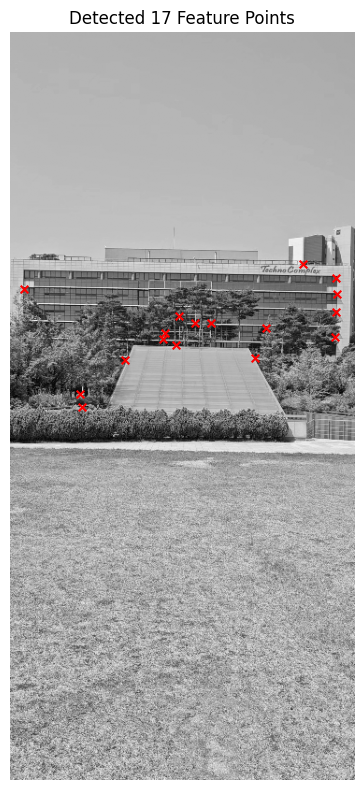

Generated 17 descriptors using pixels mode
Descriptor shape: (81,)
Detected 37 corner points


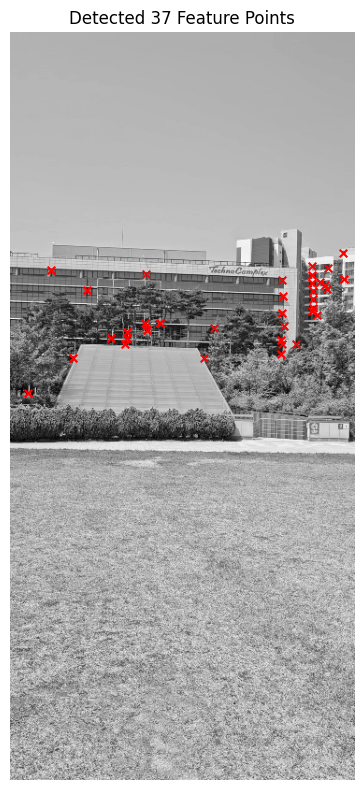

Generated 37 descriptors using pixels mode
Descriptor shape: (81,)
Found 10 matches using euclidean method


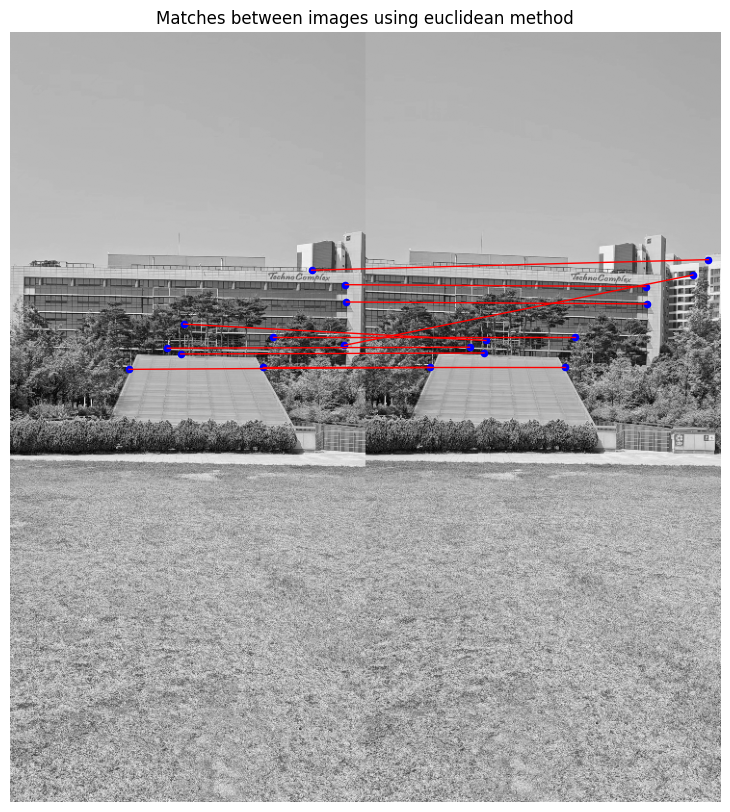

Found 17 matches using ncc method


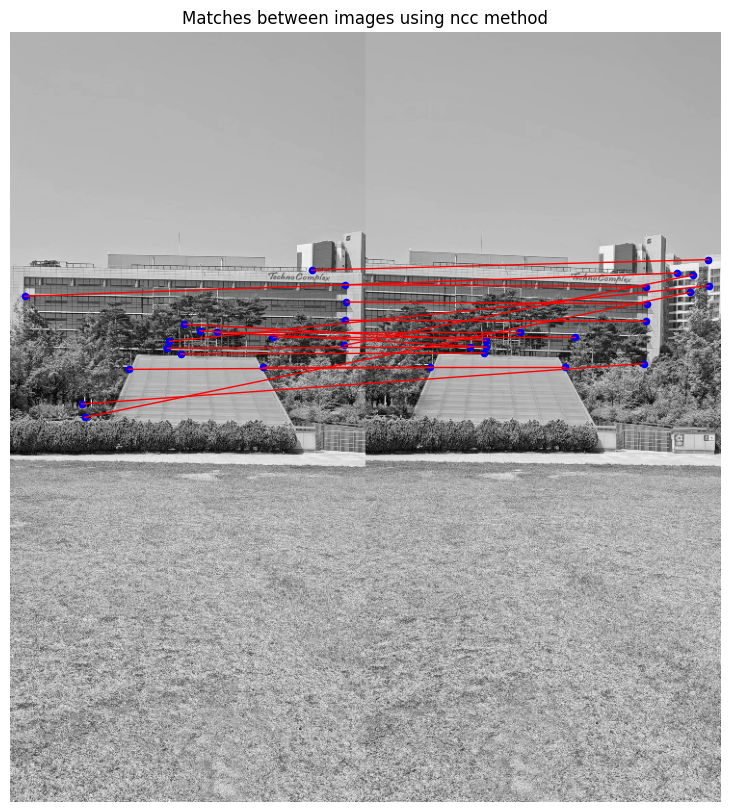

In [12]:
# 두 이미지의 특징점과 기술자 추출
points1 = getFeaturePoints(images[0], threshold=0.4, window_size=5, nms_window_size=7)
desc1 = getFeatureDescriptors(images[0], points1, mode='pixels', window_size=9)

points2 = getFeaturePoints(images[1], threshold=0.4, window_size=5, nms_window_size=7)
desc2 = getFeatureDescriptors(images[1], points2, mode='pixels', window_size=9)

# 유클리드 거리 기반 매칭
matches_euclidean = match2Images(images[0], images[1], points1, points2, desc1, desc2, 
                                match_method='euclidean', ratio_threshold=0.8)

# 정규화된 상호 상관관계 기반 매칭
matches_ncc = match2Images(images[0], images[1], points1, points2, desc1, desc2, 
                          match_method='ncc', ratio_threshold=0.8)

- 0.2 vs 0.3??

In [13]:
def refineMatches(image1, image2, points1, points2, matches, inlier_threshold=3.0, max_iterations=1000, plot=True):
    """
    Refine matches using RANSAC to estimate a homography transformation.
    
    Parameters:
    -----------
    image1, image2 : ndarray
        Input images
    points1, points2 : list
        Lists of feature points for each image
    matches : list
        List of (index1, index2) tuples representing matches
    inlier_threshold : float
        Maximum allowed distance (in pixels) for a match to be considered an inlier
    max_iterations : int
        Maximum number of RANSAC iterations
    plot : bool
        Whether to plot the surviving matches
        
    Returns:
    --------
    ndarray
        Estimated homography matrix (3x3)
    list
        Indices of inlier matches
    """
    # Check if we have enough matches
    if len(matches) < 4:
        print("Not enough matches to estimate homography")
        return None, []
    
    # Extract matching points
    src_pts = np.float32([points1[m[0]] for m in matches])
    dst_pts = np.float32([points2[m[1]] for m in matches])
    
    # Function to estimate homography from 4 point correspondences
    def estimate_homography(src_points, dst_points):
        """
        Estimate homography matrix from point correspondences using Direct Linear Transform.
        """
        # For each correspondence, we have 2 equations
        A = np.zeros((2 * len(src_points), 9), dtype=np.float32)
        
        for i, ((x1, y1), (x2, y2)) in enumerate(zip(src_points, dst_points)):
            # First equation: x2*(h11*x1 + h12*y1 + h13) - (h31*x1 + h32*y1 + h33)*x2 = 0
            # Second equation: y2*(h11*x1 + h12*y1 + h13) - (h31*x1 + h32*y1 + h33)*y2 = 0
            # Rearranged for DLT
            row1 = 2 * i
            row2 = 2 * i + 1
            
            A[row1, :] = [x1, y1, 1, 0, 0, 0, -x2*x1, -x2*y1, -x2]
            A[row2, :] = [0, 0, 0, x1, y1, 1, -y2*x1, -y2*y1, -y2]
        
        # Find the nullspace of A using SVD
        _, _, V = np.linalg.svd(A)
        
        # The last row of V contains the solution (smallest singular value)
        H = V[-1].reshape(3, 3)
        
        # Normalize H so that H[2,2] = 1
        H = H / H[2, 2]
        
        return H
    
    # Function to compute inliers given a homography
    def compute_inliers(H, src_points, dst_points, threshold):
        """
        Compute inliers for a given homography matrix.
        Returns inlier indices and average residual for inliers.
        """
        num_points = len(src_points)
        inliers = []
        
        # Convert to homogeneous coordinates
        src_homogeneous = np.column_stack([src_points, np.ones(num_points)])
        
        # Transform source points
        # (H @ src_homogeneous.T).T gives the transformed points in homogeneous coordinates
        transformed = (H @ src_homogeneous.T).T
        
        # Convert back from homogeneous coordinates
        transformed_x = transformed[:, 0] / transformed[:, 2]
        transformed_y = transformed[:, 1] / transformed[:, 2]
        transformed_points = np.column_stack([transformed_x, transformed_y])
        
        # Compute the squared distance between transformed and target points
        squared_distances = np.sum((transformed_points - dst_points)**2, axis=1)
        
        # Find inliers (points with distance less than threshold)
        for i in range(num_points):
            if squared_distances[i] < threshold**2:
                inliers.append(i)
        
        # Calculate average residual for inliers
        if inliers:
            avg_residual = np.mean(np.sqrt(squared_distances[inliers]))
        else:
            avg_residual = float('inf')
        
        return inliers, avg_residual
    
    # RANSAC algorithm
    best_H = None
    best_inliers = []
    best_residual = float('inf')
    
    # For reproducibility, set random seed
    np.random.seed(42)
    
    for iteration in range(max_iterations):
        # Step 1: Randomly select 4 matches
        if len(matches) <= 4:
            # If we only have 4 matches, use all of them
            sample_indices = list(range(len(matches)))
        else:
            # Otherwise, randomly select 4 matches
            sample_indices = np.random.choice(len(matches), 4, replace=False)
        
        sample_src = np.float32([src_pts[i] for i in sample_indices])
        sample_dst = np.float32([dst_pts[i] for i in sample_indices])
        
        # Step 2: Estimate homography from the 4 point correspondences
        try:
            H = estimate_homography(sample_src, sample_dst)
        except np.linalg.LinAlgError:
            # Skip if homography estimation fails (e.g., singular matrix)
            continue
        
        # Step 3: Compute inliers
        inliers, avg_residual = compute_inliers(H, src_pts, dst_pts, inlier_threshold)
        
        # Step 4: Update the best model if this one is better
        if len(inliers) > len(best_inliers) or (len(inliers) == len(best_inliers) and avg_residual < best_residual):
            best_H = H
            best_inliers = inliers
            best_residual = avg_residual
    
    # Final step: Re-estimate homography using all inliers for better accuracy
    if len(best_inliers) >= 4:
        inlier_src = np.float32([src_pts[i] for i in best_inliers])
        inlier_dst = np.float32([dst_pts[i] for i in best_inliers])
        
        try:
            best_H = estimate_homography(inlier_src, inlier_dst)
            # Recompute inliers and residual
            best_inliers, best_residual = compute_inliers(best_H, src_pts, dst_pts, inlier_threshold)
        except np.linalg.LinAlgError:
            # If this fails, keep the previous best homography
            pass
    
    # Print results
    print(f"RANSAC results: {len(best_inliers)} inliers out of {len(matches)} matches")
    print(f"Average residual for inliers: {best_residual:.2f} pixels")
    
    # Visualize inlier matches if requested
    if plot and len(best_inliers) > 0:
        # Create a figure
        plt.figure(figsize=(15, 10))
        
        # Determine the dimensions for side-by-side image display
        h1, w1 = image1.shape[:2]
        h2, w2 = image2.shape[:2]
        
        # Create a combined image
        combined_height = max(h1, h2)
        combined_width = w1 + w2
        combined_image = np.zeros((combined_height, combined_width), dtype=np.float32)
        
        # Copy the images to the combined image
        combined_image[:h1, :w1] = image1
        combined_image[:h2, w1:w1+w2] = image2
        
        # Display the combined image
        plt.imshow(combined_image, cmap='gray')
        
        # Draw lines between matching points (inliers only)
        for idx in best_inliers:
            match = matches[idx]
            idx1, idx2 = match
            x1, y1 = points1[idx1]
            x2, y2 = points2[idx2]
            
            # Adjust x-coordinate for the second image
            x2 += w1
            
            # Draw a line
            plt.plot([x1, x2], [y1, y2], 'g-', linewidth=1)
            
            # Draw points
            plt.scatter(x1, y1, c='b', s=20)
            plt.scatter(x2, y2, c='b', s=20)
        
        plt.title(f'Refined Matches: {len(best_inliers)} inliers (green lines), {len(matches) - len(best_inliers)} outliers')
        plt.axis('off')
        plt.show()
    
    # Return the estimated homography and inlier indices
    return best_H, [matches[i] for i in best_inliers]

RANSAC results: 9 inliers out of 17 matches
Average residual for inliers: 0.73 pixels


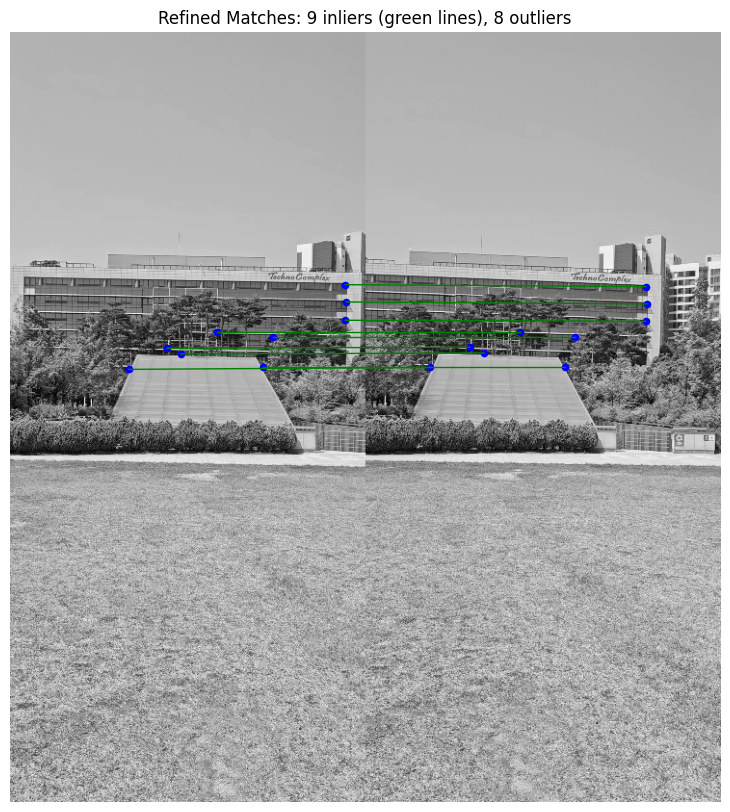

Estimated homography matrix:
[[ 1.5976039e+00  2.6302505e-01 -1.8937265e+02]
 [ 1.9951011e-01  1.8574843e+00 -1.6281883e+02]
 [ 5.5523100e-04  1.1428724e-03  1.0000000e+00]]


In [14]:
# RANSAC을 사용하여 매칭 정제 및 호모그래피 추정
H, inlier_matches = refineMatches(images[0], images[1], points1, points2, matches_ncc, 
                                 inlier_threshold=3.0, max_iterations=1000)

print(f"Estimated homography matrix:\n{H}")

In [15]:
def warpImages(images, homographies, plot=True):
    """
    Warp images 2-n onto the image space of image 1 using homographies.
    
    Parameters:
    -----------
    images : list
        List of n input images
    homographies : list
        List of n-1 homography matrices. homographies[i-1] maps from images[i] to images[0]
    plot : bool
        Whether to plot the stitched image
        
    Returns:
    --------
    ndarray
        Full stitched panorama image
    """
    if len(images) != len(homographies) + 1:
        raise ValueError("Number of homographies should be one less than number of images")
    
    # First, determine the size of the output panorama
    # Extract all corners from all images
    all_corners = []
    
    # Add corners of the first image (reference image)
    h_base, w_base = images[0].shape[:2]
    corners_base = np.array([[0, 0], [w_base, 0], [w_base, h_base], [0, h_base]], dtype=np.float32)
    all_corners.append(corners_base)
    
    # Add transformed corners of subsequent images
    for i in range(1, len(images)):
        h, w = images[i].shape[:2]
        corners = np.array([[0, 0], [w, 0], [w, h], [0, h]], dtype=np.float32)
        
        # Convert to homogeneous coordinates
        corners_homogeneous = np.column_stack([corners, np.ones(4)])
        
        # Apply homography transformation (directly from image i to image 0)
        transformed = homographies[i-1] @ corners_homogeneous.T
        
        # Convert back from homogeneous coordinates
        transformed = transformed.T
        transformed[:, 0] /= transformed[:, 2]
        transformed[:, 1] /= transformed[:, 2]
        
        all_corners.append(transformed[:, :2])
    
    # Flatten the list of corner arrays
    all_corners = np.vstack(all_corners)
    
    # Find the minimum and maximum coordinates
    min_x, min_y = np.min(all_corners, axis=0)
    max_x, max_y = np.max(all_corners, axis=0)
    
    # Create translation matrix to ensure all points are in positive coordinates
    translation = np.array([
        [1, 0, -min_x],
        [0, 1, -min_y],
        [0, 0, 1]
    ])
    
    # Calculate the size of the output image
    output_width = int(np.ceil(max_x - min_x))
    output_height = int(np.ceil(max_y - min_y))
    
    print(f"Output panorama size: {output_width}x{output_height}")
    
    # Create the output panorama
    panorama = np.zeros((output_height, output_width), dtype=np.float32)
    
    # Create a mask to track which pixels have been filled (for blending)
    mask = np.zeros((output_height, output_width), dtype=np.float32)
    
    # Warp and add each image to the panorama
    for i in range(len(images)):
        img = images[i]
        
        if i == 0:
            # For the first image, just apply translation
            H = translation
        else:
            # For subsequent images, apply homography and then translation
            H = translation @ homographies[i-1]
        
        # Warp the image using the combined transformation
        warped = cv2.warpPerspective(img, H, (output_width, output_height))
        
        # Create a binary mask of the warped image (1 where there's image data, 0 elsewhere)
        warped_mask = (warped > 0).astype(np.float32)
        
        # Update the panorama by averaging overlapping regions
        # For non-overlapping regions, just copy the new data
        overlap = (mask > 0) & (warped_mask > 0)
        
        # Non-overlapping regions in the warped image
        panorama = panorama * mask + warped * (1 - mask)
        
        # For overlapping regions, compute the weighted average
        if np.any(overlap):
            # In overlapping regions, perform averaging
            weight1 = mask[overlap]
            weight2 = warped_mask[overlap]
            total_weight = weight1 + weight2
            
            # Average the pixel values
            panorama[overlap] = (panorama[overlap] * weight1 + warped[overlap] * weight2) / total_weight
        
        # Update the mask
        mask = np.maximum(mask, warped_mask)
    
    # Plot the result if requested
    if plot:
        plt.figure(figsize=(15, 10))
        plt.imshow(panorama, cmap='gray')
        plt.title('Stitched Panorama')
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    return panorama

Processing image pair 0 and 1
Detected 191 corner points


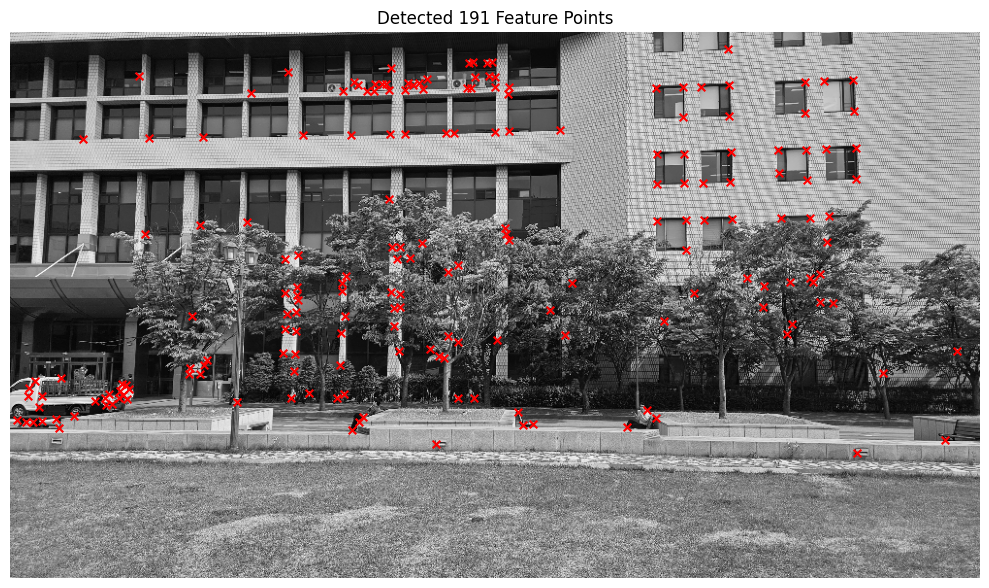

Generated 191 descriptors using pixels mode
Descriptor shape: (81,)
Detected 220 corner points


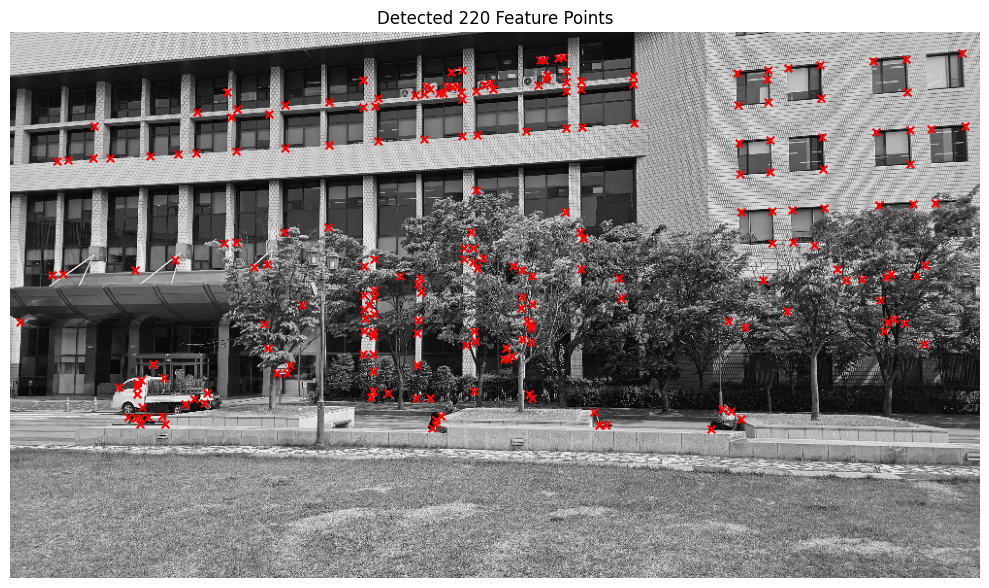

Generated 220 descriptors using pixels mode
Descriptor shape: (81,)
Found 37 matches using euclidean method
RANSAC results: 34 inliers out of 37 matches
Average residual for inliers: 0.49 pixels
Output panorama size: 1147x629


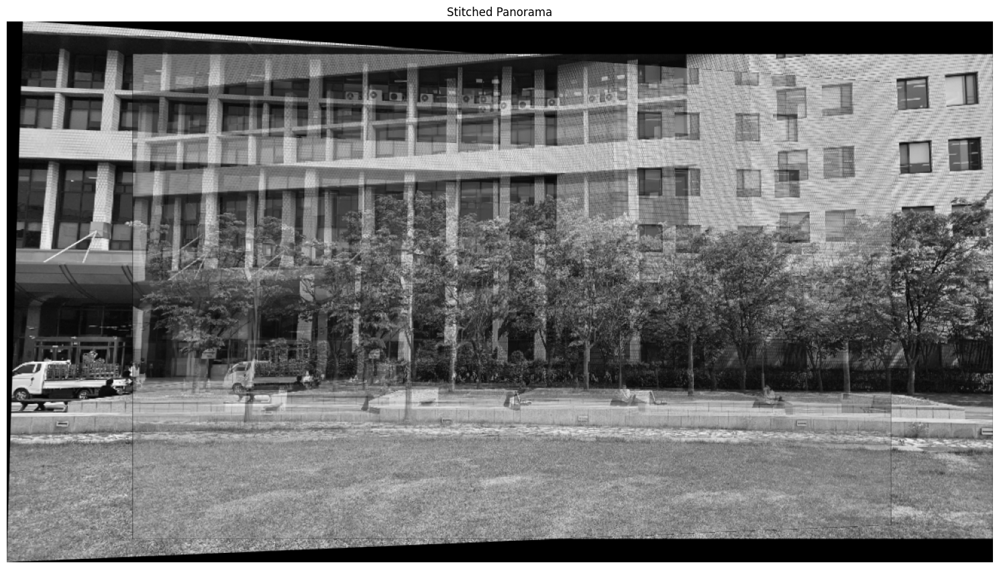

In [53]:

def custom_stitch(images):
    # 모든 이미지 쌍에 대해 호모그래피 계산
    homographies = []

    for i in range(len(images) - 1):
        print(f"Processing image pair {i} and {i+1}")
        
        # 특징점 및 기술자 추출
        pt_threshold = 0.3
        pt_win_size = 5
        nms_win_size = 7
        desc_win_size = 9
        
        points1 = getFeaturePoints(images[i], threshold=pt_threshold, window_size=pt_win_size, nms_window_size=nms_win_size)
        desc1 = getFeatureDescriptors(images[i], points1, mode='pixels', window_size=desc_win_size)
        
        points2 = getFeaturePoints(images[i+1], threshold=pt_threshold, window_size=pt_win_size, nms_window_size=nms_win_size)
        desc2 = getFeatureDescriptors(images[i+1], points2, mode='pixels', window_size=desc_win_size)
        
        # 매칭
        # matches_method = match2Images(
        #     images[i], images[i+1], points1, points2, desc1, desc2,
        #     match_method='ncc', ratio_threshold=0.8, plot=False
        # )
        # ncc 대신 euclidean 거리 사용, 비율 임계값 조정
        matches_method = match2Images(
            images[i], images[i+1], points1, points2, desc1, desc2,
            match_method='euclidean', ratio_threshold=0.7, plot=False
        )
        
        # RANSAC을 통한 호모그래피 추정
        # H, _ = refineMatches(images[i], images[i+1], points1, points2, matches_method, 
        #                      inlier_threshold=3.0, max_iterations=1000, plot=False)
        # inlier 임계값을 낮추고, 반복 횟수 증가
        H, _ = refineMatches(images[i], images[i+1], points1, points2, matches_method, 
                            inlier_threshold=2.0, max_iterations=2000, plot=False)
        
        if H is not None:
            homographies.append(H)
        else:
            print(f"Failed to estimate homography for image pair {i} and {i+1}")
            # 실패한 경우 단위 행렬로 대체 (no transformation)
            homographies.append(np.eye(3))


    # cumulative homogrphy (images[i] to images[0])
    cumulative_homographies = [np.eye(3, dtype=np.float32)]
    for pair in homographies:
        cumulative_homographies.append(cumulative_homographies[-1] @ pair)

    # pivot center index 0 to mid
    n = len(images)
    mid = n // 2 
    H0_to_mid = np.linalg.inv(cumulative_homographies[mid])
    H_mid = []
    for i in range(n):
        H_mid.append((H0_to_mid @ cumulative_homographies[i]).astype(np.float32))

    order = [mid] + list(range(mid+1, n)) + list(range(0, mid))
    ordered_imgs = [images[i] for i in order]
    ordered_homs = [H_mid[i] for i in order if i != mid] 

    # 이미지 워핑 및 스티칭
    panorama = warpImages(ordered_imgs, ordered_homs)

custom_stitch(images[1:3])

Processing image pair 0 and 1
Found 1349 keypoints in image 0 and 1468 keypoints in image 1
Found 352 good matches between image 0 and 1
RANSAC found 340 inliers out of 352 matches
Processing image pair 1 and 2
Found 1468 keypoints in image 1 and 1519 keypoints in image 2
Found 371 good matches between image 1 and 2
RANSAC found 358 inliers out of 371 matches
Processing image pair 2 and 3
Found 1519 keypoints in image 2 and 1714 keypoints in image 3
Found 414 good matches between image 2 and 3
RANSAC found 391 inliers out of 414 matches
Processing image pair 3 and 4
Found 1714 keypoints in image 3 and 1946 keypoints in image 4
Found 457 good matches between image 3 and 4
RANSAC found 391 inliers out of 457 matches
Processing image pair 4 and 5
Found 1946 keypoints in image 4 and 2032 keypoints in image 5
Found 422 good matches between image 4 and 5
RANSAC found 405 inliers out of 422 matches
Processing image pair 5 and 6
Found 2032 keypoints in image 5 and 1989 keypoints in image 6
Fou

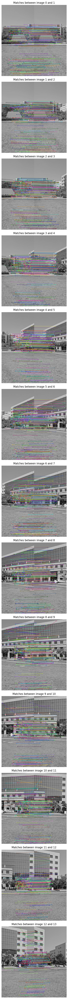

Output panorama size: 584x893


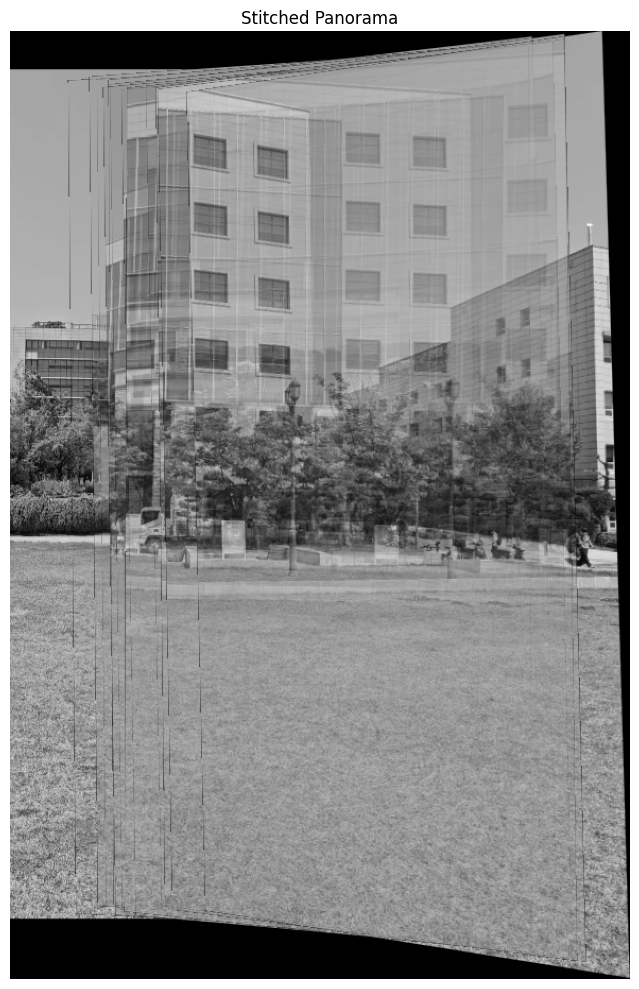

Output panorama size: 24640x13220


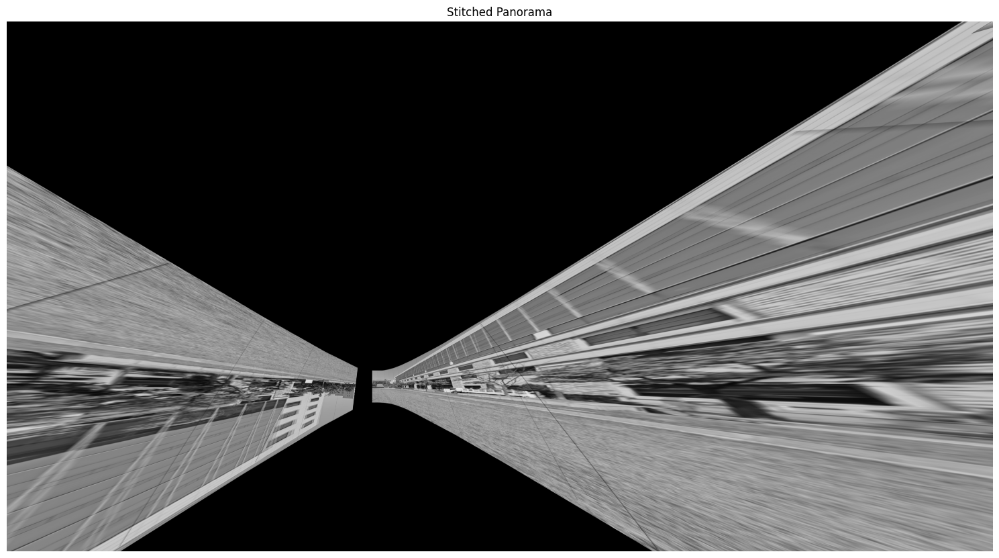

Output panorama size: 12542x8765


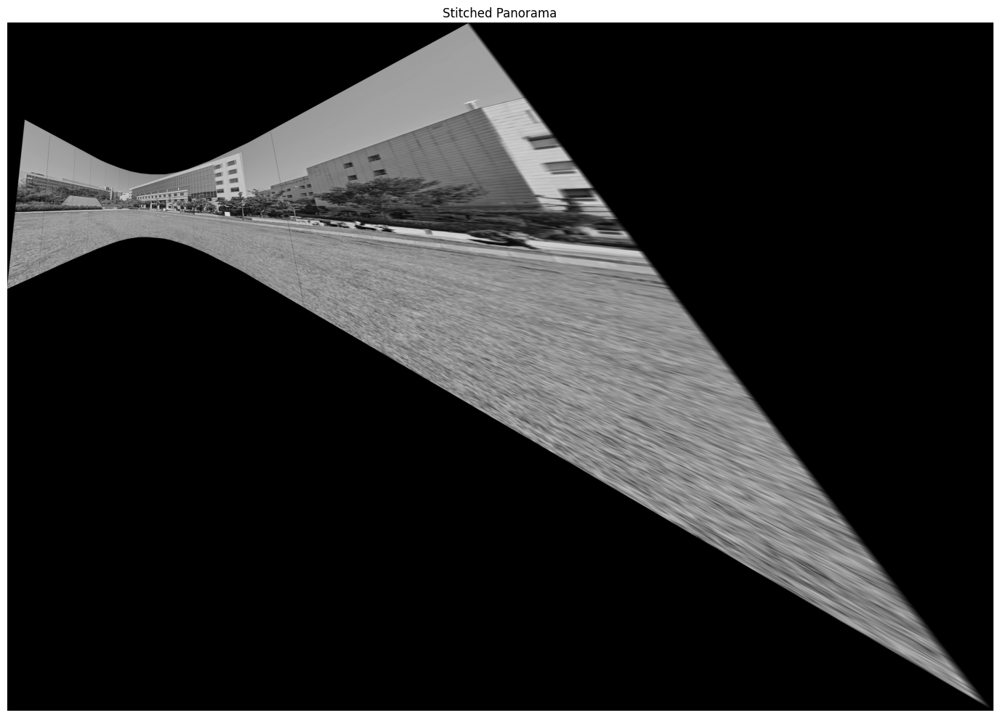

In [77]:
def stitch_images_opencv(images):
    """
    Use OpenCV built-in functions to stitch images.
    
    Parameters:
    -----------
    images : list
        List of input images
        
    Returns:
    --------
    ndarray
        Stitched panorama image
    homographies : list
        List of estimated homographies
    """
    # Initialize variables
    pairwise_homographies = []
    
    # For visualization
    all_matches_images = []
    
    for i in range(len(images) - 1):
        print(f"Processing image pair {i} and {i+1}")
        
        # Convert images to uint8 if they are float
        img1 = (images[i] * 255).astype(np.uint8) if images[i].dtype == np.float32 else images[i]
        img2 = (images[i+1] * 255).astype(np.uint8) if images[i+1].dtype == np.float32 else images[i+1]
        
        # 1. Initialize SIFT detector
        sift = cv2.SIFT_create()
        
        # 2. Detect keypoints and compute descriptors
        kp1, desc1 = sift.detectAndCompute(img1, None)
        kp2, desc2 = sift.detectAndCompute(img2, None)
        
        print(f"Found {len(kp1)} keypoints in image {i} and {len(kp2)} keypoints in image {i+1}")
        
        # 3. Match descriptors using Brute-Force Matcher
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        raw_matches = bf.knnMatch(desc1, desc2, k=2)
        
        # 4. Apply ratio test (Lowe's ratio test)
        good_matches = []
        for m, n in raw_matches:
            if m.distance < 0.7 * n.distance:  # Ratio test
                good_matches.append(m)
        
        print(f"Found {len(good_matches)} good matches between image {i} and {i+1}")
        
        # Create a match visualization image
        matches_img = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, 
                                      flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        all_matches_images.append(matches_img)
        
        # 5. Extract matched keypoints
        if len(good_matches) >= 4:
            src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
            
            # 6. Find Homography using RANSAC
            H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            
            # Count inliers
            inliers = np.sum(mask)
            print(f"RANSAC found {inliers} inliers out of {len(good_matches)} matches")
            
            # Add homography to the list (this maps from image i to image i+1)
            # For our stitching function, we need homographies that map from image i+1 to image i
            # So we compute the inverse
            pairwise_homographies.append(np.linalg.inv(H))
        else:
            print(f"Not enough matches found between image {i} and {i+1}")
            pairwise_homographies.append(np.eye(3))  # Identity matrix as fallback

    # cumulative homogrphy (images[i] to images[0])
    cumulative_homographies = [np.eye(3, dtype=np.float32)]
    for pair in pairwise_homographies:
        cumulative_homographies.append(cumulative_homographies[-1] @ pair)
    
    # pivot center index 0 to mid
    n = len(images)
    mid = n // 2 
    H0_to_mid = np.linalg.inv(cumulative_homographies[mid])
    H_mid = []
    for i in range(n):
        H_mid.append((H0_to_mid @ cumulative_homographies[i]).astype(np.float32))

    order = [mid] + list(range(mid+1, n)) + list(range(0, mid))
    ordered_images = [images[i] for i in order]
    ordered_homographies = [H_mid[i] for i in order if i != mid] 

    
    # Display match visualizations
    fig, axes = plt.subplots(len(all_matches_images), 1, figsize=(15, 5 * len(all_matches_images)))
    if len(all_matches_images) == 1:
        axes = [axes]
    
    for i, (ax, img) in enumerate(zip(axes, all_matches_images)):
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(f"Matches between image {i} and {i+1}")
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Use our warpImages function to create the panorama
    panorama = warpImages(images, pairwise_homographies)
    panorama = warpImages(images, cumulative_homographies[1:])
    panorama = warpImages(ordered_images, ordered_homographies)
    
    return panorama, pairwise_homographies

panorama_opencv, homographies_opencv = stitch_images_opencv(images[0:14])
# OpenCV 내장 함수를 사용한 스티칭

Resized image from 1080x2336 to 369x800
Loaded image 00.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 01.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 02.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 03.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 04.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 05.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 06.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 07.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 08.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 09.jpg: shape=(800, 369), dtype=float32
Resized image from 1080x2336 to 369x800
Loaded image 10.jpg: shape=(80

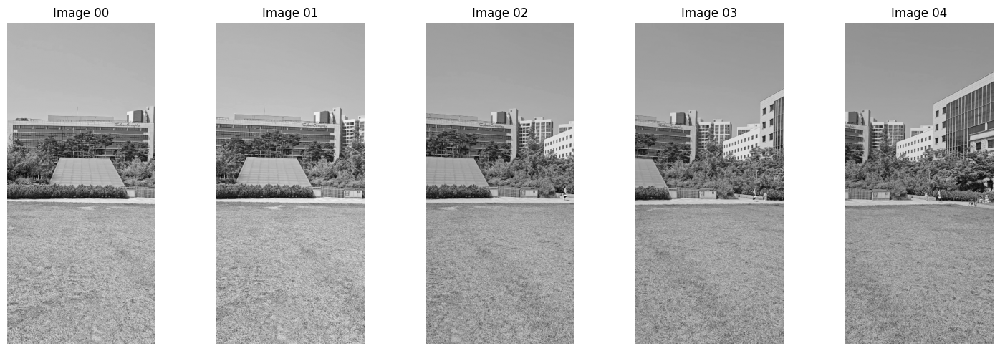

Processing image pair 0 and 1
Detected 70 corner points


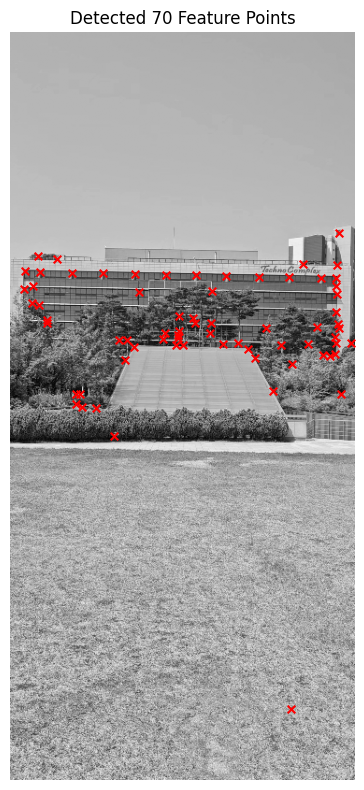

Generated 70 descriptors using pixels mode
Descriptor shape: (81,)
Detected 102 corner points


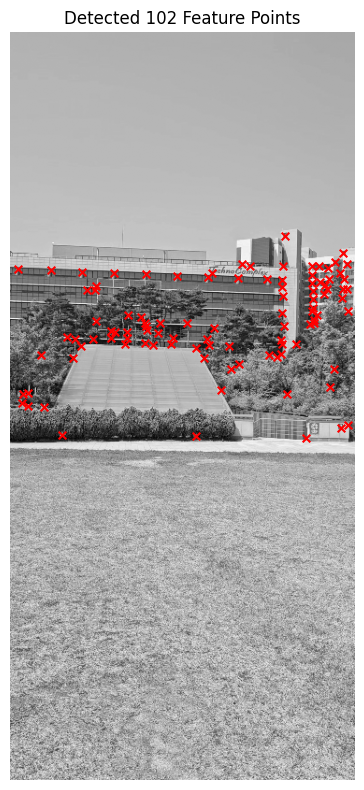

Generated 102 descriptors using pixels mode
Descriptor shape: (81,)
Found 28 matches using euclidean method


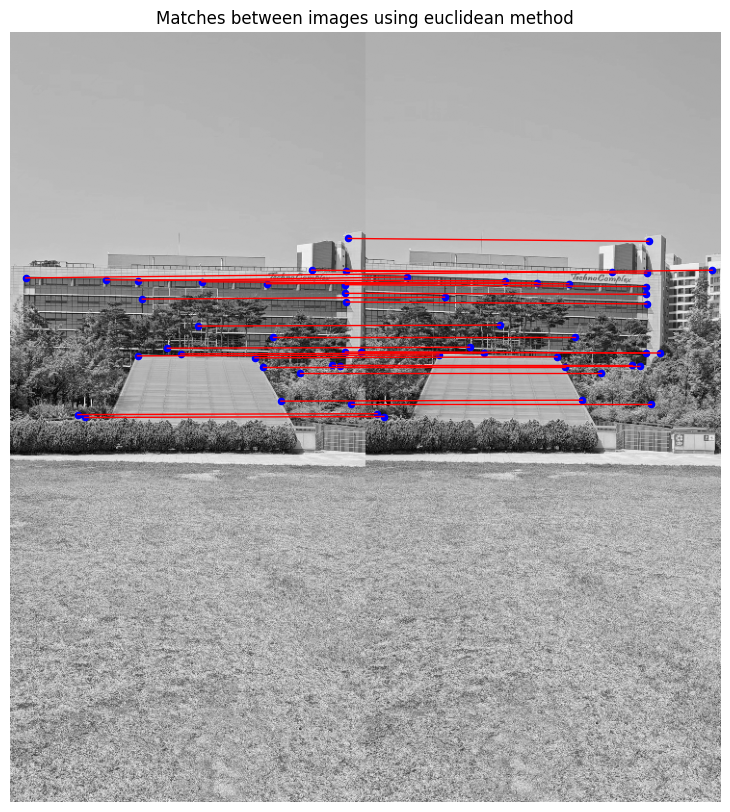

RANSAC results: 23 inliers out of 28 matches
Average residual for inliers: 0.45 pixels


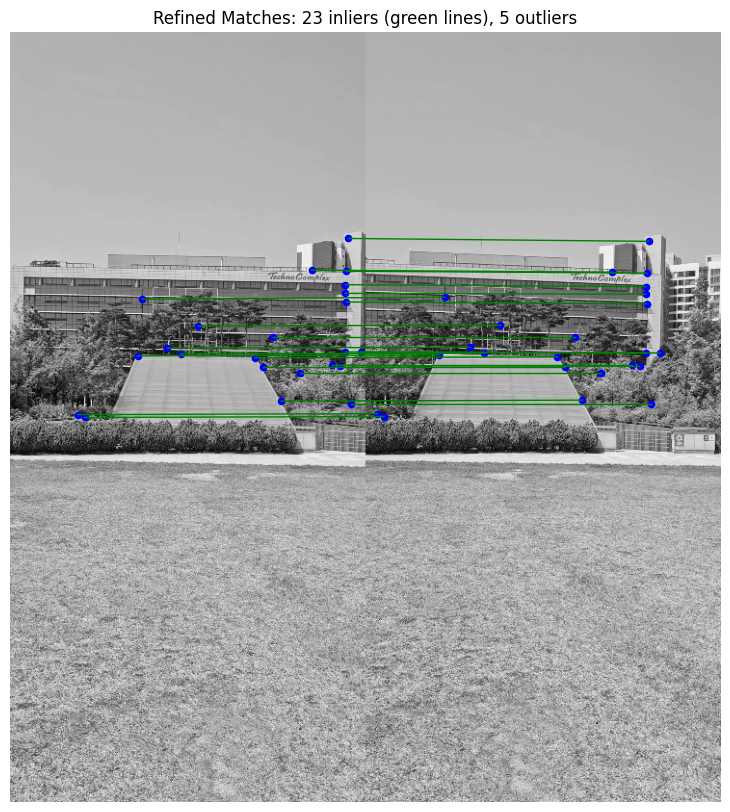

Output panorama size: 432x825


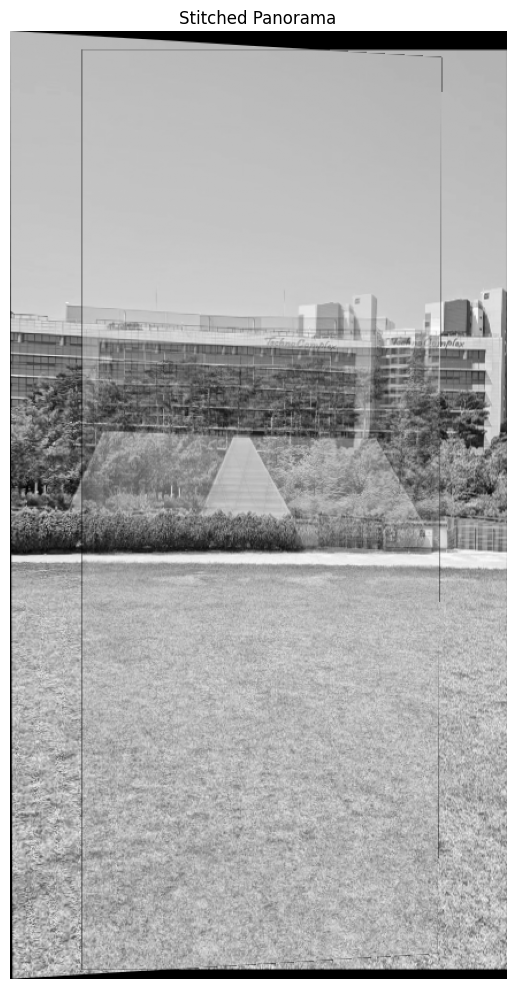

Output panorama size: 432x825


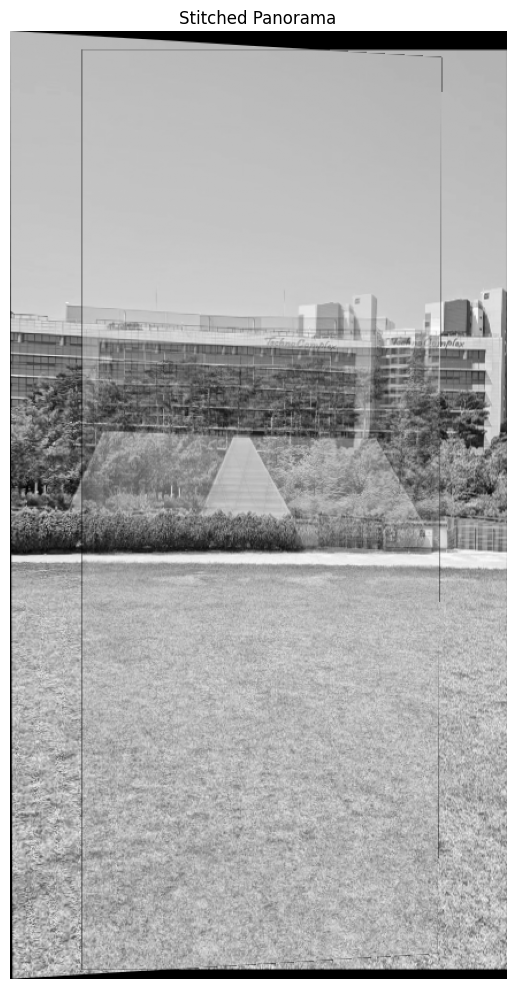

Output panorama size: 434x829


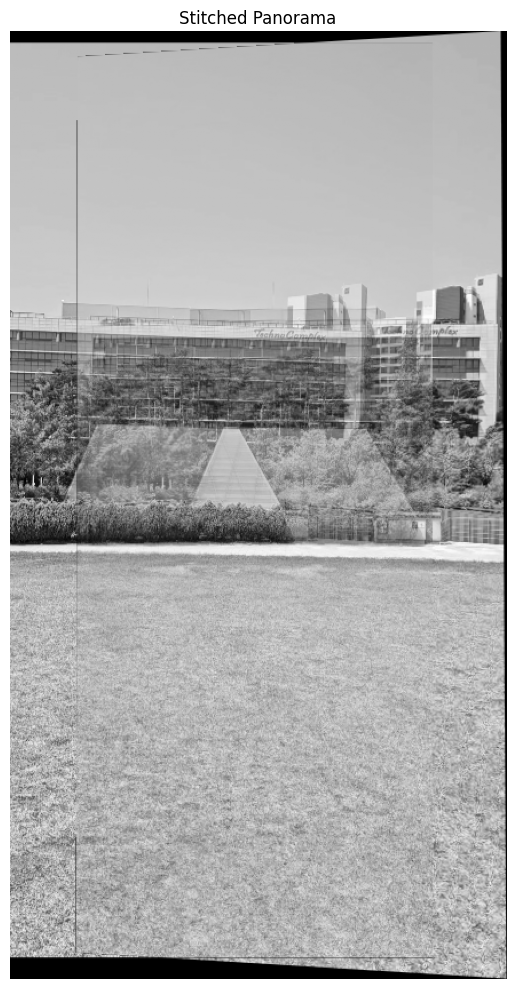

In [75]:

def custom_stitch(images, verbose=True):
    # 모든 이미지 쌍에 대해 호모그래피 계산
    homographies = []

    for i in range(len(images) - 1):
        print(f"Processing image pair {i} and {i+1}")
        
        # 특징점 및 기술자 추출
        mode = 'pixels'#'gradients'
        pt_threshold = 0.3
        pt_win_size = 5
        nms_win_size = 7
        desc_win_size = 9
        
        points1 = getFeaturePoints(images[i], threshold=pt_threshold, window_size=pt_win_size, nms_window_size=nms_win_size, plot=verbose)
        desc1 = getFeatureDescriptors(images[i], points1, mode=mode, window_size=desc_win_size)
        
        points2 = getFeaturePoints(images[i+1], threshold=pt_threshold, window_size=pt_win_size, nms_window_size=nms_win_size, plot=verbose)
        desc2 = getFeatureDescriptors(images[i+1], points2, mode=mode, window_size=desc_win_size)
        
        # 매칭
        # matches_method = match2Images(
        #     images[i], images[i+1], points1, points2, desc1, desc2,
        #     match_method='ncc', ratio_threshold=0.8, plot=verbose
        # )
        # ncc 대신 euclidean 거리 사용, 비율 임계값 조정
        matches_method = match2Images(
            images[i], images[i+1], points1, points2, desc1, desc2,
            match_method='euclidean', ratio_threshold=0.75, plot=verbose
        )
        
        # RANSAC을 통한 호모그래피 추정
        # H, _ = refineMatches(images[i], images[i+1], points1, points2, matches_method, 
        #                      inlier_threshold=3.0, max_iterations=1000, plot=verbose)
        # inlier 임계값을 낮추고, 반복 횟수 증가
        H, _ = refineMatches(images[i], images[i+1], points1, points2, matches_method, 
                            inlier_threshold=3.0, max_iterations=2000, plot=verbose)
        
        if H is not None:
            homographies.append(H)
        else:
            print(f"Failed to estimate homography for image pair {i} and {i+1}")
            # 실패한 경우 단위 행렬로 대체 (no transformation)
            homographies.append(np.eye(3))


    # cumulative homogrphy (images[i] to images[0])
    cumulative_homographies = [np.eye(3, dtype=np.float32)]
    for pair in homographies:
        cumulative_homographies.append(cumulative_homographies[-1] @ pair)

    # pivot center index 0 to mid
    n = len(images)
    mid = n // 2 
    H0_to_mid = np.linalg.inv(cumulative_homographies[mid])
    H_mid = []
    for i in range(n):
        H_mid.append((H0_to_mid @ cumulative_homographies[i]).astype(np.float32))

    order = [mid] + list(range(mid+1, n)) + list(range(0, mid))
    ordered_imgs = [images[i] for i in order]
    ordered_homs = [H_mid[i] for i in order if i != mid] 

    # 이미지 워핑 및 스티칭
    panorama = warpImages(images, homographies)
    panorama = warpImages(images, cumulative_homographies[1:])
    panorama = warpImages(ordered_imgs, ordered_homs)
    

images = loadImages(directory='assets/0', num_images=18, max_width=1000, max_height=800)
custom_stitch(images[0:2])